# 2026-06-11 Single-Label Audio Adversarial Inspection

Inspect single-label untargeted audio adversarial outputs generated at L2 epsilon 2.4.

This notebook is designed for:
- browsing by model, sample, and attacked label
- listening to original/adversarial/perturbation audio
- viewing cochleagram-like model input features (fbank/log-mel) for side-by-side comparison

In [12]:
from __future__ import annotations

import json
from pathlib import Path
from typing import Any

import ipywidgets as widgets
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import torch
from IPython.display import Audio, Markdown, display

plt.style.use("seaborn-v0_8")

from src.models.audio import get_audio_model
from src.models.audio.panns_cnn14 import PannsCnn14AudioModelWrapper

In [13]:
def _workspace_root() -> Path:
    cwd = Path.cwd().resolve()
    if (cwd / "experiments").exists():
        return cwd
    if (cwd.parent / "experiments").exists():
        return cwd.parent
    return cwd


REPO_ROOT = _workspace_root()
RUN_ROOT = REPO_ROOT / "experiments" / "audio" / "single_label_adversarial" / "2026_06_11"
AUDIOSET_LABEL_CSV = REPO_ROOT / "assets" / "class_labels_indices.csv"
AUDIOSET_LABEL_CSV_URL = (
    "https://raw.githubusercontent.com/tensorflow/models/master/research/audioset/"
    "yamnet/yamnet_class_map.csv"
)


def _read_jsonl(path: Path) -> list[dict[str, Any]]:
    rows: list[dict[str, Any]] = []
    if not path.exists():
        return rows
    with path.open("r", encoding="utf-8") as handle:
        for line in handle:
            line = line.strip()
            if not line:
                continue
            rows.append(json.loads(line))
    return rows


def _load_audioset_label_names() -> dict[int, str]:
    if AUDIOSET_LABEL_CSV.exists():
        label_df = pd.read_csv(AUDIOSET_LABEL_CSV)
    else:
        label_df = pd.read_csv(AUDIOSET_LABEL_CSV_URL)
    if not {"index", "display_name"}.issubset(set(label_df.columns)):
        return {}
    return {
        int(row["index"]): str(row["display_name"])
        for _, row in label_df[["index", "display_name"]].iterrows()
    }


def _resolve_target_label_name(record: dict[str, Any], label_name_map: dict[int, str]) -> str:
    target_label = record.get("target_audioset_label")
    if target_label is None:
        return ""
    try:
        target_label_idx = int(target_label)
    except (TypeError, ValueError):
        return str(target_label)

    metadata_name = str(record.get("target_label_name", "")).strip()
    if metadata_name and not metadata_name.startswith("label_"):
        return metadata_name
    return label_name_map.get(target_label_idx, f"label_{target_label_idx}")


def _load_records(run_root: Path, label_name_map: dict[int, str]) -> pd.DataFrame:
    rows: list[dict[str, Any]] = []
    for metadata_path in sorted(run_root.glob("*/adversarial/*/logits/metadata.jsonl")):
        model_name = metadata_path.parts[-5]
        attack_id = metadata_path.parts[-3]
        for record in _read_jsonl(metadata_path):
            source_info = record.get("source_info", {})
            saved_paths = record.get("saved_paths", {})
            rows.append(
                {
                    "model_name": model_name,
                    "attack_id": attack_id,
                    "sample_idx": int(record.get("sample_idx", source_info.get("tfrecord_example_index", -1))),
                    "ytid": source_info.get("ytid", ""),
                    "target_audioset_label": record.get("target_audioset_label"),
                    "target_model_label": record.get("target_model_label"),
                    "target_label_name": _resolve_target_label_name(record, label_name_map),
                    "all_source_labels": record.get("all_source_labels", source_info.get("labels", [])),
                    "all_source_label_names": record.get("all_source_label_names", []),
                    "classification_loss": record.get("classification_loss"),
                    "delta_l2": record.get("delta_l2"),
                    "snr_db": record.get("snr_db"),
                    "sample_rate": int(record.get("sample_rate", 16000)),
                    "original_pt": saved_paths.get("original_pt"),
                    "adversarial_pt": saved_paths.get("adversarial_pt"),
                    "delta_pt": saved_paths.get("delta_pt"),
                }
            )
    if not rows:
        return pd.DataFrame()
    df = pd.DataFrame(rows).sort_values(
        ["model_name", "sample_idx", "target_audioset_label"]
    ).reset_index(drop=True)
    return df


audioset_label_map = _load_audioset_label_names()
records_df = _load_records(RUN_ROOT, audioset_label_map)
print(f"Run root: {RUN_ROOT}")
print(f"Loaded rows: {len(records_df)}")
print(f"Loaded English label names: {len(audioset_label_map)}")
display(records_df.head(10))

Run root: /orcd/data/jhm/001/om2/rphess/projects/github.com/model_metamers_pytorch/experiments/audio/single_label_adversarial/2026_06_11
Loaded rows: 120
Loaded English label names: 521


,model_name,attack_id,sample_idx,ytid,target_audioset_label,target_model_label,target_label_name,all_source_labels,all_source_label_names,classification_loss,delta_l2,snr_db,sample_rate,original_pt,adversarial_pt,delta_pt
0,audiomae_as2m_ft_as20k,adversarial_l2_eps_2p4_single_label,9,-Qkeiyhg2zE,0,0,Speech,"[73, 78, 0, 74, 80]","[label_73, label_78, label_0, label_74, label_80]",4.567206,0.882704,36.729168,32000,experiments/audio/single_label_adversarial/202...,experiments/audio/single_label_adversarial/202...,experiments/audio/single_label_adversarial/202...
1,audiomae_as2m_ft_as20k,adversarial_l2_eps_2p4_single_label,9,-Qkeiyhg2zE,73,73,Bow-wow,"[73, 78, 0, 74, 80]","[label_73, label_78, label_0, label_74, label_80]",4.934336,0.950390,36.087433,32000,experiments/audio/single_label_adversarial/202...,experiments/audio/single_label_adversarial/202...,experiments/audio/single_label_adversarial/202...
2,audiomae_as2m_ft_as20k,adversarial_l2_eps_2p4_single_label,9,-Qkeiyhg2zE,74,74,Growling,"[73, 78, 0, 74, 80]","[label_73, label_78, label_0, label_74, label_80]",4.983020,1.311340,33.291161,32000,experiments/audio/single_label_adversarial/202...,experiments/audio/single_label_adversarial/202...,experiments/audio/single_label_adversarial/202...
3,audiomae_as2m_ft_as20k,adversarial_l2_eps_2p4_single_label,9,-Qkeiyhg2zE,78,78,Meow,"[73, 78, 0, 74, 80]","[label_73, label_78, label_0, label_74, label_80]",6.139644,0.516532,41.383518,32000,experiments/audio/single_label_adversarial/202...,experiments/audio/single_label_adversarial/202...,experiments/audio/single_label_adversarial/202...
4,audiomae_as2m_ft_as20k,adversarial_l2_eps_2p4_single_label,9,-Qkeiyhg2zE,80,80,Caterwaul,"[73, 78, 0, 74, 80]","[label_73, label_78, label_0, label_74, label_80]",6.012832,1.364577,32.945507,32000,experiments/audio/single_label_adversarial/202...,experiments/audio/single_label_adversarial/202...,experiments/audio/single_label_adversarial/202...
5,audiomae_as2m_ft_as20k,adversarial_l2_eps_2p4_single_label,12,-T9PDWg_EeU,72,72,Howl,"[73, 78, 74, 72]","[label_73, label_78, label_74, label_72]",6.109693,0.881238,22.774160,32000,experiments/audio/single_label_adversarial/202...,experiments/audio/single_label_adversarial/202...,experiments/audio/single_label_adversarial/202...
6,audiomae_as2m_ft_as20k,adversarial_l2_eps_2p4_single_label,12,-T9PDWg_EeU,73,73,Bow-wow,"[73, 78, 74, 72]","[label_73, label_78, label_74, label_72]",7.461694,1.223182,19.926197,32000,experiments/audio/single_label_adversarial/202...,experiments/audio/single_label_adversarial/202...,experiments/audio/single_label_adversarial/202...
7,audiomae_as2m_ft_as20k,adversarial_l2_eps_2p4_single_label,12,-T9PDWg_EeU,74,74,Growling,"[73, 78, 74, 72]","[label_73, label_78, label_74, label_72]",7.301628,1.172781,20.291683,32000,experiments/audio/single_label_adversarial/202...,experiments/audio/single_label_adversarial/202...,experiments/audio/single_label_adversarial/202...
8,audiomae_as2m_ft_as20k,adversarial_l2_eps_2p4_single_label,12,-T9PDWg_EeU,78,78,Meow,"[73, 78, 74, 72]","[label_73, label_78, label_74, label_72]",7.006153,0.968777,21.951550,32000,experiments/audio/single_label_adversarial/202...,experiments/audio/single_label_adversarial/202...,experiments/audio/single_label_adversarial/202...
9,audiomae_as2m_ft_as20k,adversarial_l2_eps_2p4_single_label,19,-lnaF5DjliA,137,137,Bass guitar,"[137, 138, 187]","[label_137, label_138, label_187]",0.035335,4.443021,35.306236,32000,experiments/audio/single_label_adversarial/202...,experiments/audio/single_label_adversarial/202...,experiments/audio/single_label_adversarial/202...


In [14]:
def _load_waveform(path: str) -> np.ndarray:
    tensor = torch.load(path, map_location="cpu", weights_only=False)
    waveform = torch.as_tensor(tensor).detach().cpu().float()
    if waveform.ndim == 3:
        waveform = waveform.squeeze(0)
    if waveform.ndim == 2:
        waveform = waveform.mean(dim=0)
    if waveform.ndim != 1:
        raise ValueError(f"Unexpected waveform shape for {path}: {tuple(waveform.shape)}")
    return waveform.numpy()


_MODEL_CACHE: dict[str, Any] = {}


def _get_wrapper(model_name: str):
    if model_name not in _MODEL_CACHE:
        _MODEL_CACHE[model_name] = get_audio_model(model_name, device="cpu", freeze=True)
    return _MODEL_CACHE[model_name]


def _to_feature_2d(wrapper: Any, waveform_np: np.ndarray, sr: int) -> np.ndarray:
    waveform = torch.as_tensor(waveform_np, dtype=torch.float32).unsqueeze(0)
    if isinstance(wrapper, PannsCnn14AudioModelWrapper):
        features = wrapper.input_log_mel_spectrogram(waveform, sr=sr)
        return features.detach().cpu().numpy()
    features = wrapper.preprocess(waveform, sr=sr)
    arr = features.detach().cpu().numpy()
    while arr.ndim > 2:
        arr = arr.squeeze(0)
    if arr.ndim != 2:
        raise ValueError(f"Expected 2D features, got shape {arr.shape}")
    if arr.shape[0] > arr.shape[1]:
        arr = arr.T
    return arr


def _crop_feature_time(
    feat: np.ndarray,
    show_seconds: float = 2.0,
    feature_window_seconds: float = 10.0,
) -> np.ndarray:
    if feat.ndim != 2:
        return feat
    if feature_window_seconds <= 0 or show_seconds <= 0:
        return feat
    keep = int(round(feat.shape[1] * min(show_seconds, feature_window_seconds) / feature_window_seconds))
    keep = max(1, min(keep, feat.shape[1]))
    return feat[:, :keep]


def _records_for_example(model_name: str, sample_idx: int) -> pd.DataFrame:
    subset = records_df[
        (records_df["model_name"] == model_name)
        & (records_df["sample_idx"] == int(sample_idx))
    ].copy()
    if subset.empty:
        raise ValueError(f"No records found for model={model_name}, sample_idx={sample_idx}.")
    return subset.sort_values("target_audioset_label").reset_index(drop=True)


def plot_example_all_labels(model_name: str, sample_idx: int) -> None:
    example_rows = _records_for_example(model_name, sample_idx)
    wrapper = _get_wrapper(model_name)

    ytid = str(example_rows.iloc[0]["ytid"])
    display(Markdown(f"### {model_name} | sample_idx={sample_idx} | ytid={ytid}"))

    num_rows = len(example_rows)
    fig, axes = plt.subplots(num_rows, 2, figsize=(12, max(3.0 * num_rows, 4.0)), constrained_layout=True)
    if num_rows == 1:
        axes = np.array([axes])

    for row_idx, (_, row) in enumerate(example_rows.iterrows()):
        sr = int(row["sample_rate"])
        original = _load_waveform(str(row["original_pt"]))
        adversarial = _load_waveform(str(row["adversarial_pt"]))

        feat_original = _to_feature_2d(wrapper, original, sr)
        feat_adversarial = _to_feature_2d(wrapper, adversarial, sr)

        label_name = str(row["target_label_name"])
        label_idx = int(row["target_audioset_label"])

        ax_o = axes[row_idx, 0]
        ax_a = axes[row_idx, 1]

        im_o = ax_o.imshow(feat_original, aspect="auto", origin="lower", cmap="magma")
        im_a = ax_a.imshow(feat_adversarial, aspect="auto", origin="lower", cmap="magma")

        ax_o.set_title("Original")
        ax_a.set_title("Adversarial")
        ax_o.set_ylabel(f"Label {label_idx}")
        ax_o.set_xlabel("Reference")
        ax_a.set_xlabel(f"Attacked: {label_name} ({label_idx})")

        for ax in (ax_o, ax_a):
            ax.set_xticks([])
            ax.set_yticks([])

        fig.colorbar(im_o, ax=ax_o, fraction=0.046, pad=0.04)
        fig.colorbar(im_a, ax=ax_a, fraction=0.046, pad=0.04)

    plt.show()

    display(Markdown("#### Audio playback (original, adversarial, perturbation)"))
    for _, row in example_rows.iterrows():
        sr = int(row["sample_rate"])
        label_name = str(row["target_label_name"])
        label_idx = int(row["target_audioset_label"])
        original = _load_waveform(str(row["original_pt"]))
        adversarial = _load_waveform(str(row["adversarial_pt"]))
        delta = _load_waveform(str(row["delta_pt"]))

        display(Markdown(f"**Attacked label:** {label_name} ({label_idx})"))
        display(Audio(data=original, rate=sr, normalize=False))
        display(Audio(data=adversarial, rate=sr, normalize=False))
        display(Audio(data=delta, rate=sr, normalize=False))

In [15]:
records_df['sample_idx'].unique()

array([ 9, 12, 19, 20, 22, 30, 34, 42, 55, 65])

### audiomae_as2m_ft_as20k | sample_idx=12 | ytid=-T9PDWg_EeU

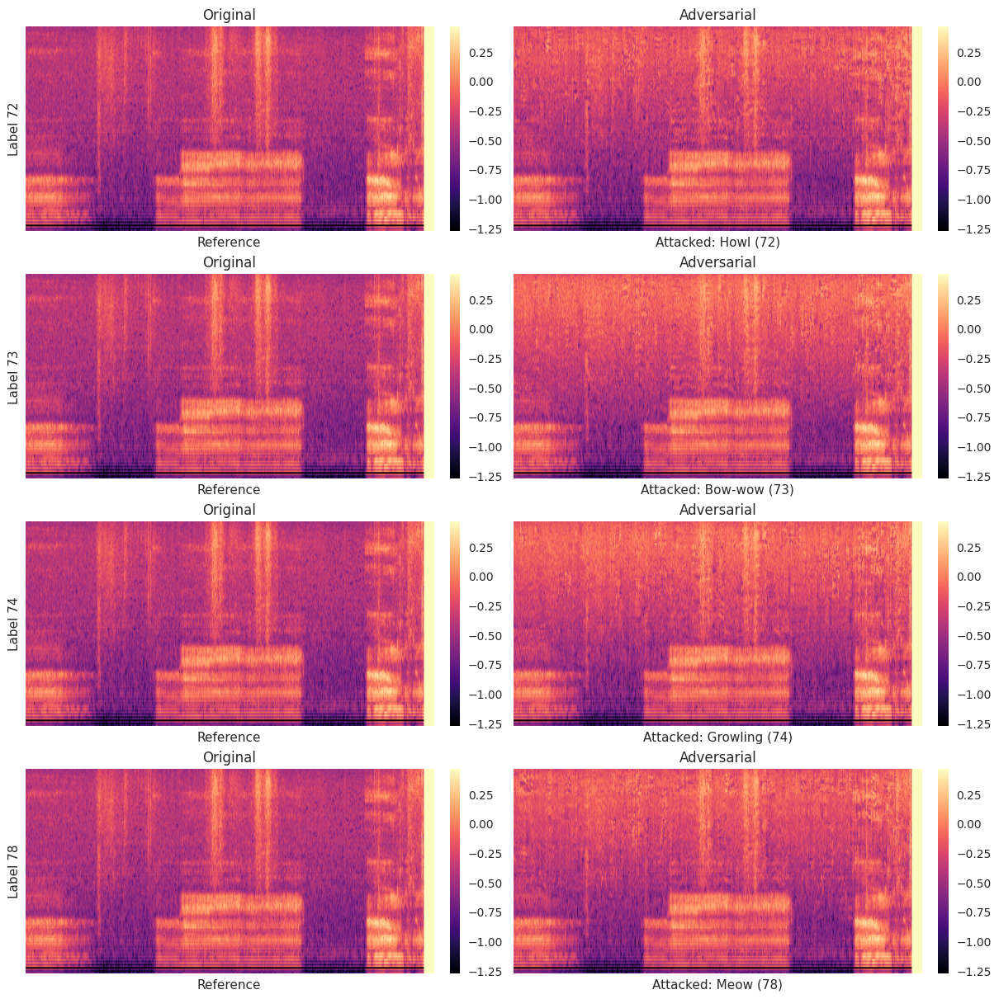

#### Audio playback (original, adversarial, perturbation)

**Attacked label:** Howl (72)

**Attacked label:** Bow-wow (73)

**Attacked label:** Growling (74)

**Attacked label:** Meow (78)

In [18]:
# Edit these two values, then run this single cell.
SELECTED_MODEL_NAME = "audiomae_as2m_ft_as20k"
SELECTED_SAMPLE_IDX = 12

plot_example_all_labels(
    model_name=SELECTED_MODEL_NAME,
    sample_idx=SELECTED_SAMPLE_IDX,
)